In [1]:
## Import required modules

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import contextily as ctx

In [2]:
gdb_blocks = gpd.read_file('../../data/02_gdb/02_gdb_manz.shp')
mgn_blocks = gpd.read_file('../../data/06_DANE_MGN/MGN_URB_MANZANA.shp', 
                           converters={'mpio_ccdgo':str,
                                      'clas_ccdgo':str,
                                      'setr_ccdgo':str,
                                      'secr_ccdgo':str,
                                      'setu_ccdgo':str,
                                      'secu_ccdgo':str,
                                      'manz_ccdgo':str})

In [3]:
#Census blocks, concatenate code and clean unnecesary columns

mgn_blocks['cod_dane'] = mgn_blocks['MPIO_CCDGO'] + mgn_blocks['CLAS_CCDGO'] + "00" + mgn_blocks['SETR_CCDGO'] + mgn_blocks['SECR_CCDGO'] + mgn_blocks['SETU_CCDGO'] + mgn_blocks['SECU_CCDGO'] + mgn_blocks['MANZ_CCDGO']

#Reduce the database to only geometry and census code

mgn_blocks_reduced = mgn_blocks[['cod_dane','Shape_Leng','Shape_Area','geometry']]

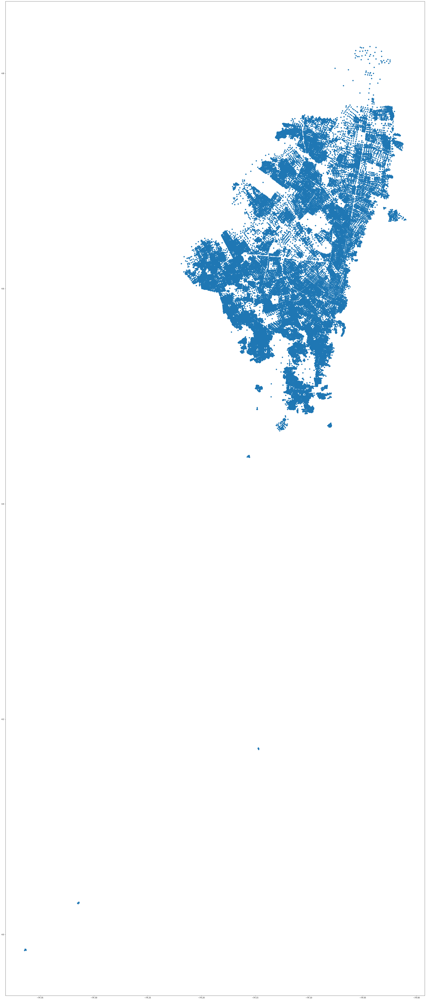

In [4]:
##Calculate centroid, define as main geometry and simplify database

gdb_blocks['centroid'] = gdb_blocks.centroid
gdb_blocks = gdb_blocks.set_geometry('centroid')
gdb_blocks_reduced = gdb_blocks[['ManCodigo','SHAPE_Area','centroid']]
#gdb_blocks_reduced = gdb_blocks_reduced.rename(columns={'centroid': 'geometry'})

gdb_blocks_reduced.plot(figsize=(400,100))

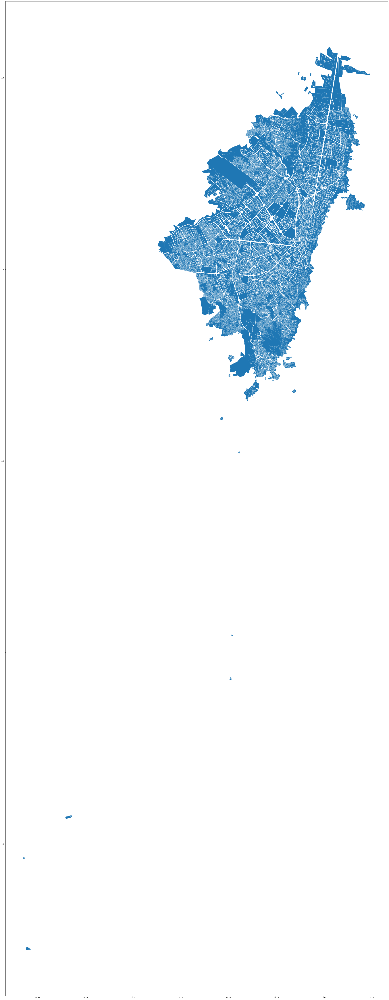

In [5]:
## Project mgn_blocks to 4326

mgn_blocks_reduced = mgn_blocks_reduced.to_crs(epsg=4686)

mgn_blocks.plot(figsize=(400,100))

In [6]:
## Spatial join

block_mgn_joined = gpd.sjoin(mgn_blocks_reduced, gdb_blocks_reduced, how='left', op= 'intersects')

block_mgn_joined

,cod_dane,Shape_Leng,Shape_Area,geometry,index_right,ManCodigo,SHAPE_Area
0,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",21420.0,006403028,5.860855e-08
0,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",28670.0,006403027,6.203897e-08
0,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40241.0,006403025,5.912308e-08
0,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40242.0,006403054,1.222608e-07
0,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40282.0,006403007,1.075752e-06
1,110011000000064020919,0.004081,9.998505e-07,"POLYGON ((-74.13436 4.67957, -74.13495 4.67912...",23057.0,006403026,9.998511e-07
2,110011000000064030215,0.002127,2.572230e-07,"POLYGON ((-74.13465 4.68263, -74.13487 4.68241...",5046.0,006403029,2.766167e-07
3,110011000000064030217,0.001641,1.500361e-07,"POLYGON ((-74.13480 4.68301, -74.13484 4.68297...",10340.0,006403030,1.500362e-07
4,110011000000063020410,0.002942,4.549105e-07,"POLYGON ((-74.12150 4.66389, -74.12158 4.66382...",231.0,006302010,4.549075e-07
5,110011000000063020203,0.003051,6.541770e-07,"POLYGON ((-74.11667 4.66108, -74.11670 4.66108...",5668.0,006302018,9.092521e-07


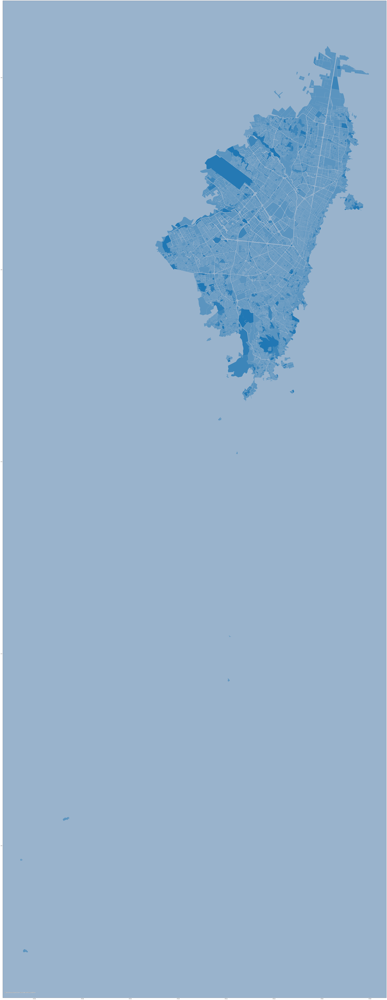

In [7]:
plt.rcParams['agg.path.chunksize'] = 10000
#block_mgn_joined.plot(figsize=(400,100), alpha = 0.5)
ax = block_mgn_joined.plot(figsize=(800, 200), alpha=0.5)
ctx.add_basemap(ax, zoom = 18)
#block_mgn_joined.plot(figsize=(800, 200), alpha=0.5)

In [10]:
## Import strata processing from GDB and census

strata_gdb_block = pd.read_csv('../../outputs/01_strata/strata_per_block.csv',converters={'cod_mz':str, 'main_strata':str})
strata_gdb_block['ManCodigo']=strata_gdb_block['cod_mz']
strata_gdb_block_reduced= strata_gdb_block.drop(['cod_mz','E_01','E_02','E_03','E_04','E_05','E_06','max_area','strata_count','mixed_strata'], axis=1)

strata_census_block = pd.read_csv('../../outputs/01_strata/census_strata_per_block.csv',converters={'cod_mz':str})
strata_census_block['cod_dane'] = strata_census_block['cod_mz']

strata_gdb_block_reduced
#strata_census_block

,Unnamed: 0,total_block_area,main_strata,ManCodigo
0,0,7.170005e+04,E02,001101002
1,1,3.191662e+04,E02,001101003
2,2,2.844528e+03,E02,001101004
3,3,5.441407e+03,E02,001101005
4,4,1.717901e+07,E03,001101006
5,5,4.339866e+03,E02,001101008
6,6,4.057798e+06,E02,001101009
7,7,5.243671e+03,E03,001101013
8,8,6.093690e+05,E02,001102001
9,9,3.685082e+03,E02,001102002


In [11]:

block_mgn_strata_joined = pd.merge(block_mgn_joined, strata_gdb_block_reduced, how = 'left', on='ManCodigo')


## Temporal treatment of NAN values

#block_mgn_strata_joined.loc[(block_mgn_strata_joined['main_strata'].isnan ),'main_strata'] = "E09"
block_mgn_strata_joined.loc[(block_mgn_strata_joined['main_strata'].isnull() ),'main_strata'] = "E09"

block_mgn_strata_joined

,cod_dane,Shape_Leng,Shape_Area,geometry,index_right,ManCodigo,SHAPE_Area,Unnamed: 0,total_block_area,main_strata
0,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",21420.0,006403028,5.860855e-08,27640.0,5.860855e+02,E03
1,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",28670.0,006403027,6.203897e-08,27639.0,6.203897e+02,E03
2,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40241.0,006403025,5.912308e-08,27637.0,5.912308e+02,E03
3,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40242.0,006403054,1.222608e-07,27662.0,1.222634e+03,E03
4,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40282.0,006403007,1.075752e-06,27621.0,8.812026e+04,E03
5,110011000000064020919,0.004081,9.998505e-07,"POLYGON ((-74.13436 4.67957, -74.13495 4.67912...",23057.0,006403026,9.998511e-07,27638.0,2.699598e+06,E03
6,110011000000064030215,0.002127,2.572230e-07,"POLYGON ((-74.13465 4.68263, -74.13487 4.68241...",5046.0,006403029,2.766167e-07,NaN,NaN,E09
7,110011000000064030217,0.001641,1.500361e-07,"POLYGON ((-74.13480 4.68301, -74.13484 4.68297...",10340.0,006403030,1.500362e-07,27641.0,1.500362e+03,E03
8,110011000000063020410,0.002942,4.549105e-07,"POLYGON ((-74.12150 4.66389, -74.12158 4.66382...",231.0,006302010,4.549075e-07,27252.0,3.551456e+03,E04
9,110011000000063020203,0.003051,6.541770e-07,"POLYGON ((-74.11667 4.66108, -74.11670 4.66108...",5668.0,006302018,9.092521e-07,27259.0,1.405118e+06,E04


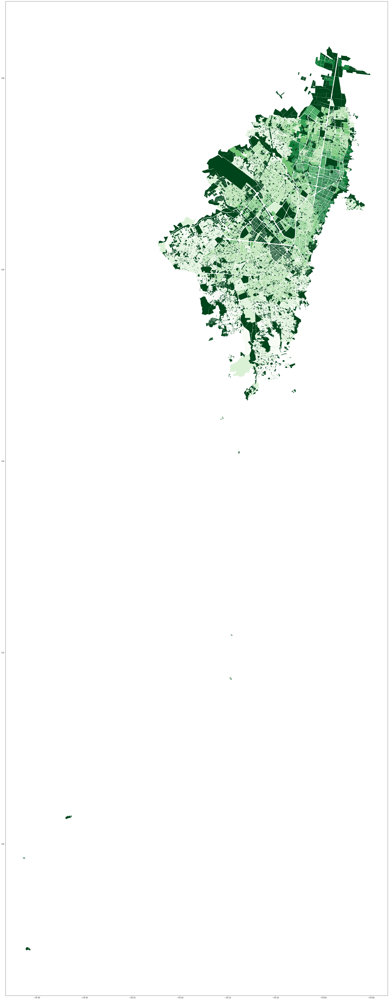

In [12]:
block_mgn_strata_joined.plot(column = 'main_strata',cmap='Greens', figsize=(400,100))
#block_mgn_strata_joined.plot()

In [13]:
## Left join to complete strata

blocks_full_strata = pd.merge(block_mgn_strata_joined, strata_census_block, how = 'left', on='cod_dane')

## replace E09 values with the census strata

blocks_full_strata.loc[(blocks_full_strata['main_strata_x'] == 'E09'),'main_strata_x'] = blocks_full_strata['main_strata_y']
blocks_full_strata.loc[(blocks_full_strata['main_strata_x'].isnull()),'main_strata_x'] = "E09"
blocks_full_strata.loc[(blocks_full_strata['main_strata_x'].isnull()),'main_strata_y'] = "E09"

## Fix airport strata to E09
blocks_full_strata.loc[(blocks_full_strata['cod_mz'] == '110011000000056240106'),'main_strata_x'] = "E09"

## Group by dane block
blocks_full_strata

,cod_dane,Shape_Leng,Shape_Area,geometry,index_right,ManCodigo,SHAPE_Area,Unnamed: 0_x,total_block_area,main_strata_x,...,E00,E01,E02,E03,E04,E05,E06,E09,max_population,main_strata_y
0,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",21420.0,006403028,5.860855e-08,27640.0,5.860855e+02,E03,...,0.0,1.0,0.0,464.0,0.0,0.0,0.0,0.0,464.0,E03
1,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",28670.0,006403027,6.203897e-08,27639.0,6.203897e+02,E03,...,0.0,1.0,0.0,464.0,0.0,0.0,0.0,0.0,464.0,E03
2,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40241.0,006403025,5.912308e-08,27637.0,5.912308e+02,E03,...,0.0,1.0,0.0,464.0,0.0,0.0,0.0,0.0,464.0,E03
3,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40242.0,006403054,1.222608e-07,27662.0,1.222634e+03,E03,...,0.0,1.0,0.0,464.0,0.0,0.0,0.0,0.0,464.0,E03
4,110011000000064020323,0.006490,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",40282.0,006403007,1.075752e-06,27621.0,8.812026e+04,E03,...,0.0,1.0,0.0,464.0,0.0,0.0,0.0,0.0,464.0,E03
5,110011000000064020919,0.004081,9.998505e-07,"POLYGON ((-74.13436 4.67957, -74.13495 4.67912...",23057.0,006403026,9.998511e-07,27638.0,2.699598e+06,E03,...,0.0,0.0,0.0,648.0,0.0,0.0,0.0,2.0,648.0,E03
6,110011000000064030215,0.002127,2.572230e-07,"POLYGON ((-74.13465 4.68263, -74.13487 4.68241...",5046.0,006403029,2.766167e-07,NaN,NaN,E09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,110011000000064030217,0.001641,1.500361e-07,"POLYGON ((-74.13480 4.68301, -74.13484 4.68297...",10340.0,006403030,1.500362e-07,27641.0,1.500362e+03,E03,...,0.0,0.0,6.0,87.0,0.0,0.0,0.0,0.0,87.0,E03
8,110011000000063020410,0.002942,4.549105e-07,"POLYGON ((-74.12150 4.66389, -74.12158 4.66382...",231.0,006302010,4.549075e-07,27252.0,3.551456e+03,E04,...,0.0,0.0,0.0,0.0,55.0,0.0,0.0,0.0,55.0,E04
9,110011000000063020203,0.003051,6.541770e-07,"POLYGON ((-74.11667 4.66108, -74.11670 4.66108...",5668.0,006302018,9.092521e-07,27259.0,1.405118e+06,E04,...,0.0,0.0,0.0,5.0,533.0,0.0,0.0,0.0,533.0,E04


In [14]:
blocks_strata_export = blocks_full_strata[['cod_dane','ManCodigo','Shape_Area','geometry','main_strata_x']]
blocks_strata_export

,cod_dane,ManCodigo,Shape_Area,geometry,main_strata_x
0,110011000000064020323,006403028,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",E03
1,110011000000064020323,006403027,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",E03
2,110011000000064020323,006403025,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",E03
3,110011000000064020323,006403054,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",E03
4,110011000000064020323,006403007,1.413612e-06,"POLYGON ((-74.13780 4.67795, -74.13781 4.67794...",E03
5,110011000000064020919,006403026,9.998505e-07,"POLYGON ((-74.13436 4.67957, -74.13495 4.67912...",E03
6,110011000000064030215,006403029,2.572230e-07,"POLYGON ((-74.13465 4.68263, -74.13487 4.68241...",E09
7,110011000000064030217,006403030,1.500361e-07,"POLYGON ((-74.13480 4.68301, -74.13484 4.68297...",E03
8,110011000000063020410,006302010,4.549105e-07,"POLYGON ((-74.12150 4.66389, -74.12158 4.66382...",E04
9,110011000000063020203,006302018,6.541770e-07,"POLYGON ((-74.11667 4.66108, -74.11670 4.66108...",E04


In [15]:
#delete duplicates where spatial join trows more than 1 block per line

blocks_strata_export = blocks_strata_export.sort_values(['cod_dane','main_strata_x'], ascending = ['True','False'])
blocks_strata_export.drop_duplicates(subset = 'cod_dane', keep = 'first', inplace = True)

#block_mgn_joined.drop_duplicates(subset = 'cod_dane', keep = 'first', inplace = True)
blocks_strata_export

,cod_dane,ManCodigo,Shape_Area,geometry,main_strata_x
13965,110011000000011010101,001101001,6.972580e-07,"POLYGON ((-74.08194 4.58512, -74.08194 4.58513...",E02
13966,110011000000011010102,001101002,1.441212e-06,"POLYGON ((-74.08092 4.58565, -74.08089 4.58561...",E02
13940,110011000000011010103,001101007,4.559625e-06,"POLYGON ((-74.07966 4.58357, -74.07941 4.58317...",E02
13977,110011000000011010104,001101009,2.816704e-06,"POLYGON ((-74.08211 4.58426, -74.08213 4.58422...",E02
14005,110011000000011010105,001101008,4.651486e-07,"POLYGON ((-74.07936 4.58312, -74.07917 4.58283...",E02
13976,110011000000011010106,001101005,5.624608e-07,"POLYGON ((-74.08217 4.58336, -74.08213 4.58334...",E02
13967,110011000000011010107,001101003,9.830877e-07,"POLYGON ((-74.08050 4.58383, -74.08048 4.58379...",E02
14034,110011000000011010108,001101004,2.928233e-07,"POLYGON ((-74.08198 4.58394, -74.08195 4.58393...",E02
13942,110011000000011020101,001102046,2.960960e-07,"POLYGON ((-74.08161 4.58120, -74.08150 4.58115...",E03
13837,110011000000011020102,001102058,6.986887e-08,"POLYGON ((-74.08225 4.58117, -74.08228 4.58111...",E02


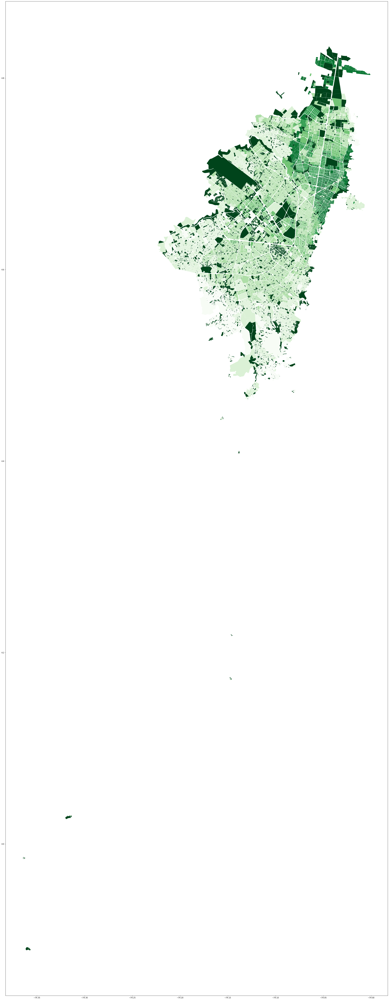

In [16]:
blocks_strata_export.plot(column = 'main_strata_x',cmap='Greens', figsize=(400,100))

In [17]:
## Calculate no of blocks (for groupin cases)

blocks_strata_export['count_blocks'] = blocks_strata_export.groupby('cod_dane')['cod_dane'].transform('count')
blocks_strata_export.to_file("../../outputs/02_GOAT_inputs/blocks_with_strata.shp")

In [18]:
## Join general population data per block
##

census_block = pd.read_csv('../../outputs/01_strata/census_strata_per_block.csv')


In [19]:
census_block['population'] = census_block['E00'] + census_block['E01'] + census_block['E02'] + census_block['E03'] + census_block['E04'] + census_block['E05'] + census_block['E06'] + census_block['E09']

census_block['cod_dane'] =census_block['cod_mz']

In [20]:
## Left join to complete strata

blocks_strata_and_pop =  pd.merge(blocks_strata_export, census_block, how = 'left', on = 'cod_dane')

## Fill NA with 0

blocks_strata_and_pop.loc[(blocks_strata_and_pop['population'].isnull()), 'population'] = 0

## Adjust population in repeated dane codes

blocks_strata_and_pop['population'] = blocks_strata_and_pop['population']/blocks_strata_and_pop['count_blocks']

blocks_strata_and_pop


,cod_dane,ManCodigo,Shape_Area,geometry,main_strata_x,count_blocks,Unnamed: 0,cod_mz,E00,E01,E02,E03,E04,E05,E06,E09,max_population,main_strata,population
0,110011000000011010101,001101001,6.972580e-07,"POLYGON ((-74.08194 4.58512, -74.08194 4.58513...",E02,1,1.0,110011000000011010101,0.0,0.0,13.0,0.0,0.0,0.0,0.0,0.0,13.0,E02,13.0
1,110011000000011010102,001101002,1.441212e-06,"POLYGON ((-74.08092 4.58565, -74.08089 4.58561...",E02,1,2.0,110011000000011010102,0.0,1.0,441.0,0.0,0.0,0.0,0.0,0.0,441.0,E02,442.0
2,110011000000011010103,001101007,4.559625e-06,"POLYGON ((-74.07966 4.58357, -74.07941 4.58317...",E02,1,3.0,110011000000011010103,0.0,12.0,750.0,12.0,2.0,4.0,0.0,2.0,750.0,E02,782.0
3,110011000000011010104,001101009,2.816704e-06,"POLYGON ((-74.08211 4.58426, -74.08213 4.58422...",E02,1,4.0,110011000000011010104,2.0,8.0,2198.0,290.0,2.0,0.0,0.0,0.0,2198.0,E02,2500.0
4,110011000000011010105,001101008,4.651486e-07,"POLYGON ((-74.07936 4.58312, -74.07917 4.58283...",E02,1,5.0,110011000000011010105,0.0,0.0,222.0,2.0,0.0,0.0,0.0,0.0,222.0,E02,224.0
5,110011000000011010106,001101005,5.624608e-07,"POLYGON ((-74.08217 4.58336, -74.08213 4.58334...",E02,1,6.0,110011000000011010106,0.0,9.0,196.0,4.0,0.0,0.0,0.0,0.0,196.0,E02,209.0
6,110011000000011010107,001101003,9.830877e-07,"POLYGON ((-74.08050 4.58383, -74.08048 4.58379...",E02,1,7.0,110011000000011010107,0.0,26.0,250.0,1.0,0.0,0.0,0.0,0.0,250.0,E02,277.0
7,110011000000011010108,001101004,2.928233e-07,"POLYGON ((-74.08198 4.58394, -74.08195 4.58393...",E02,1,8.0,110011000000011010108,0.0,11.0,110.0,0.0,0.0,0.0,0.0,0.0,110.0,E02,121.0
8,110011000000011020101,001102046,2.960960e-07,"POLYGON ((-74.08161 4.58120, -74.08150 4.58115...",E03,1,9.0,110011000000011020101,0.0,0.0,158.0,8.0,0.0,0.0,0.0,0.0,158.0,E02,166.0
9,110011000000011020102,001102058,6.986887e-08,"POLYGON ((-74.08225 4.58117, -74.08228 4.58111...",E02,1,10.0,110011000000011020102,0.0,0.0,53.0,4.0,0.0,0.0,0.0,0.0,53.0,E02,57.0


In [21]:
## Reduce shape and export file

blocks_reduced = blocks_strata_and_pop[['cod_dane','ManCodigo','Shape_Area','geometry','count_blocks','main_strata_x','population']]

blocks_reduced

,cod_dane,ManCodigo,Shape_Area,geometry,count_blocks,main_strata_x,population
0,110011000000011010101,001101001,6.972580e-07,"POLYGON ((-74.08194 4.58512, -74.08194 4.58513...",1,E02,13.0
1,110011000000011010102,001101002,1.441212e-06,"POLYGON ((-74.08092 4.58565, -74.08089 4.58561...",1,E02,442.0
2,110011000000011010103,001101007,4.559625e-06,"POLYGON ((-74.07966 4.58357, -74.07941 4.58317...",1,E02,782.0
3,110011000000011010104,001101009,2.816704e-06,"POLYGON ((-74.08211 4.58426, -74.08213 4.58422...",1,E02,2500.0
4,110011000000011010105,001101008,4.651486e-07,"POLYGON ((-74.07936 4.58312, -74.07917 4.58283...",1,E02,224.0
5,110011000000011010106,001101005,5.624608e-07,"POLYGON ((-74.08217 4.58336, -74.08213 4.58334...",1,E02,209.0
6,110011000000011010107,001101003,9.830877e-07,"POLYGON ((-74.08050 4.58383, -74.08048 4.58379...",1,E02,277.0
7,110011000000011010108,001101004,2.928233e-07,"POLYGON ((-74.08198 4.58394, -74.08195 4.58393...",1,E02,121.0
8,110011000000011020101,001102046,2.960960e-07,"POLYGON ((-74.08161 4.58120, -74.08150 4.58115...",1,E03,166.0
9,110011000000011020102,001102058,6.986887e-08,"POLYGON ((-74.08225 4.58117, -74.08228 4.58111...",1,E02,57.0


In [22]:
## Export full shapefile

blocks_reduced.to_file("../../outputs/02_GOAT_inputs/blocks_with_strata_and_pop.shp")

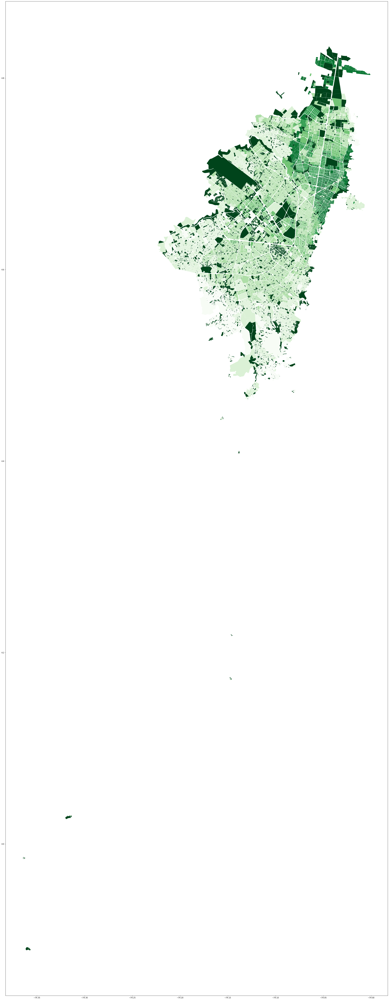

In [23]:
blocks_reduced.plot(column = 'main_strata_x',cmap='Greens', figsize=(400,100))

In [24]:
## Calculate centroid and export as population.shp

blocks_reduced['centroid'] = blocks_reduced.centroid
blocks_reduced = blocks_reduced.set_geometry('centroid')
blocks_reduced.to_file("../../outputs/02_GOAT_inputs/population.shp")





C:\Users\rafle\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


TypeError: data type not understood